<a href="https://colab.research.google.com/github/kavyajeetbora/metro_accessibility/blob/master/notebooks/metro_accessibility.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [103]:
!pip install -q osmnx
!pip install -q pandana
!pip install -q h3
!pip install -q pydeck

In [104]:
import geopandas as gpd
import pandas as pd
import osmnx as ox
import shapely
import pandana as pdna
from lxml import etree
import h3
from matplotlib import colormaps
import pydeck as pdk
from urllib.request import urlopen
import json
import matplotlib.colors as mp_color
import matplotlib.cm as cmx

## Load Data

- Load the area of interest boundary
- Load station nodes and building footprints

In [105]:
json_url = 'https://raw.githubusercontent.com/kavyajeetbora/metro_accessibility/master/data/bbox.json'

response = urlopen(json_url)
bboxs = json.loads(response.read())
city = 'Bangalore'
W,S,E,N = bboxs[city]

bbox = shapely.box(W,S,E,N)

## Download the network data within AOI

In [106]:
%%time
network = ox.graph.graph_from_polygon(
    bbox,
    network_type='all',
    simplify=True,
    retain_all=False,
    truncate_by_edge=False,
    clean_periphery=None,
    custom_filter=None
)

CPU times: user 3min 24s, sys: 4.71 s, total: 3min 28s
Wall time: 3min 44s


In [107]:
%%time
nodes, edges = ox.convert.graph_to_gdfs(network, nodes=True, edges=True) #node_geometry=True, fill_edge_geometry=True
edges = edges.reset_index()

CPU times: user 56.2 s, sys: 1.65 s, total: 57.9 s
Wall time: 1min 10s


In [108]:
edges.shape, nodes.shape

((621064, 21), (247975, 6))

In [109]:
%%time
network = pdna.Network(nodes["x"], nodes["y"], edges["u"], edges["v"],edges[["length"]])

CPU times: user 46.6 s, sys: 392 ms, total: 47 s
Wall time: 37.3 s


## Load the station data

The metro stations and lines are in KML format. We need to convert it to a gdf for further analysis

In [110]:
!wget -q https://github.com/kavyajeetbora/metro_accessibility/raw/master/data/bangalore/Bangalore_stations_stops.gpkg -O station_nodes.gpkg
station_nodes = gpd.read_file('station_nodes.gpkg', crs='EPSG:4326')
print(station_nodes.shape)
station_nodes.sample(4)

(261, 11)


,railway,internet_access,name,network,operator,public_transport,ref,train,subway,station,geometry
251,stop,None,Singayyanapalya,Namma Metro,Bangalore Metro Rail Corporation Limited,stop_position,None,None,yes,None,POINT (77.69305 12.99645)
159,station,None,Mahakavi Kuvempu Road,Namma Metro,Bangalore Metro Rail Corporation Limited,station,None,None,yes,subway,POINT (77.55690 12.99853)
163,station,None,Goraguntepalya,Namma Metro,Bangalore Metro Rail Corporation Limited,station,None,None,yes,subway,POINT (77.54090 13.02841)
118,stop,None,"Nadaprabhu Kempegowda Station, Majestic (Green...",Namma Metro,Bangalore Metro Rail Corporation Limited,stop_position,None,None,yes,None,POINT (77.57287 12.97596)


In [126]:
station_nodes['railway'].value_counts()

railway
stop        134
station      64
None         62
proposed      1
Name: count, dtype: int64

In [112]:
!wget -q https://raw.githubusercontent.com/kavyajeetbora/metro_accessibility/master/data/bangalore/Bangalore_station_buildings.geojson -O station_buildings.geojson
station_buildings = gpd.read_file('station_buildings.geojson', crs='EPSG:4326')

print(station_buildings.shape)
station_buildings.sample(4)

(118, 11)


,id,name,height,station_name,network,operator,railway,subway,station,source,geometry
104,08b61892490b0fff020034a5fb3afa0f,None,None,Doddakallasandra,Namma Metro,Bangalore Metro Rail Corporation Limited,stop,yes,None,Overture Maps,"POLYGON ((77.55219 12.88438, 77.55237 12.88444..."
27,08b60145b02d1fff02003b3f99126339,None,None,Srirampura,Namma Metro,Bangalore Metro Rail Corporation Limited,stop,yes,None,Overture Maps,"POLYGON ((77.56269 12.99659, 77.56300 12.99653..."
33,08b60145b0a90fff0200b3bd64cfa767,None,None,Mantri Square Sampige Road,Namma Metro,Bangalore Metro Rail Corporation Limited,stop,yes,None,Overture Maps,"POLYGON ((77.57130 12.98997, 77.57124 12.99004..."
65,08b60145b58b1fff0200691ca67023b3,None,None,Chickpete,Namma Metro,Bangalore Metro Rail Corporation Limited,stop,yes,None,Overture Maps,"POLYGON ((77.57474 12.96762, 77.57451 12.96763..."


## Calculate the accessibility

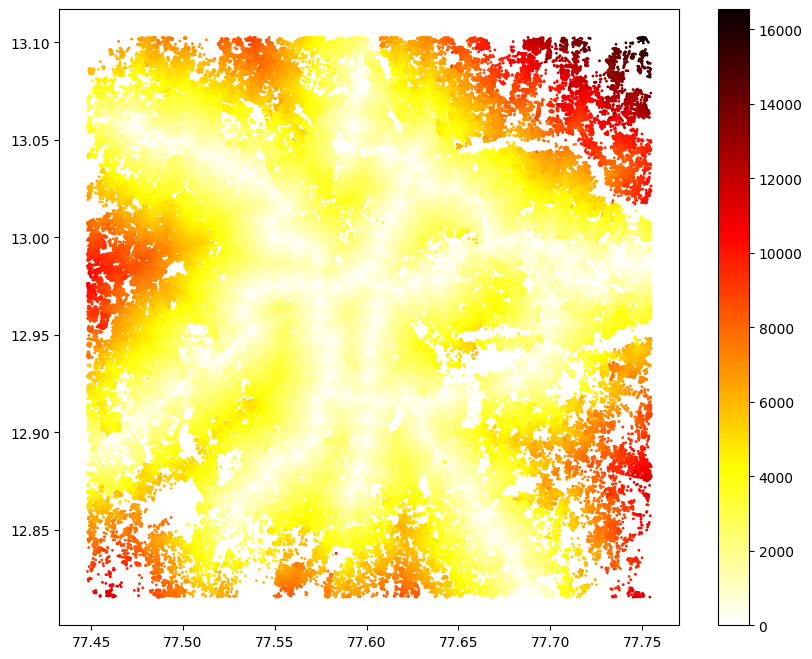

CPU times: user 39.3 s, sys: 532 ms, total: 39.8 s
Wall time: 29.9 s


In [113]:
%%time
# initialize each amenity category with the locations (lon/lat coordinates)

max_distance=25000 ## in meters
num_pois = 1

category = 'metro_stations'
network.set_pois(category=category, maxdist = max_distance, maxitems=num_pois, x_col=station_nodes['geometry'].x, y_col=station_nodes['geometry'].y)
accessibility = network.nearest_pois(distance = max_distance, category=category, num_pois=num_pois)

def plot_nearest_amenity(accessibility,n):
    fig, ax = network.plot(accessibility[n]);
    ax.set_facecolor('k');
    ax.set_title('Pedestrian accessibility to nearest Metro Stations in Delhi (distance to pois, in meters (n = {}))'.format(category,n), fontsize=14);
    return fig

fig = plot_nearest_amenity(accessibility,num_pois)

Note: above data is calculated for every node of the network. So compressing it to hexbins to compact the data and also makes it easier for visualization

In [114]:
%%time
APERTURE_SIZE = 9
hex_col = 'hex'+str(APERTURE_SIZE)

distance = nodes.join(accessibility)[['geometry', 1]].rename(columns={1:'distance_m'})
distance[hex_col] = distance.apply(lambda p: h3.geo_to_h3(p.geometry.y,p.geometry.x,APERTURE_SIZE),1)

distance_m = distance[[hex_col, 'distance_m']].groupby(hex_col).mean().reset_index()
# distance_m['display_text'] = distance_m['distance_m'].apply(lambda x: f"Distance: {x:.0f} meters")
distance_m.sample(5)

CPU times: user 16 s, sys: 173 ms, total: 16.2 s
Wall time: 16.5 s


,hex9,distance_m
7424,8961892cb2bffff,1853.295212
2894,8960145a9a3ffff,4494.755906
3031,8960145ac73ffff,1847.334239
1873,89601459197ffff,1089.661716
9156,89618935bbbffff,3650.369803


In [115]:
distance_m.to_parquet(f'{city}_accessibility.parquet')

Divide the distance by average speed. Here average speed is considered as 20 km/hr as per TomTom's traffic index ranking:

https://www.tomtom.com/traffic-index/ranking/?country=IN

In [116]:
distance_m['mins'] = distance_m['distance_m']/(20*16.6667)
distance_m['display_text'] = distance_m['mins'].apply(lambda x: f"Accessibility: {x:.0f} mins")
distance_m['mins'].describe()[['min','max']]

min     0.200819
max    49.322912
Name: mins, dtype: float64

## Visualizing in 3D map

In [118]:
def create_custom_cmap(values):
    # Define the colors for the colormap
    colors = ['#42f5da', '#7DDA58', '#DECE58', '#DE8758', '#DE5858']

    # Create the colormap object
    cmap = mp_color.ListedColormap(colors)

    # Define the color boundaries for the colormap
    boundaries = values

    # Create the normalization object
    norm = mp_color.BoundaryNorm(boundaries, len(colors))

    return cmap, norm

def get_color_value(value, cmap, norm):
    # Normalize the value to the range of the colormap
    norm_value = norm(value)

    # Get the color value from the colormap
    color = cmap(norm_value)

    scaled_colors = list(map(lambda x: int(x*255), color[:3]))
    scaled_alpha = int(color[3]*100)

    scaled_colors += [scaled_alpha]
    return scaled_colors


def colormap_dataframe(df, value_col, cmap, norm, max_val=None):

    xdf = df.copy()
    # if max_val is None:
    #     max_val = xdf[value_col].max()

    ## Scale the temperature values between 0-1; using MinMax Scaler
    # xdf[f'norm_{value_col}'] = (xdf[value_col]-xdf[value_col].min())/(max_val-xdf[value_col].min())
    # xdf['color'] = xdf[f'norm_{value_col}'].apply(lambda x: get_color_value(x, cmap, norm))

    xdf['color'] = xdf[f'{value_col}'].apply(lambda x: get_color_value(x, cmap, norm))
    xdf[['R', 'G', 'B', 'A']] = pd.DataFrame(xdf['color'].to_list())
    xdf = xdf.drop(['color'], axis=1)

    xdf[value_col] = xdf[value_col].round(1)

    return xdf

def create_h3_hex_layer(df):

    # Define a layer to display on a map
    layer = pdk.Layer(
        "H3HexagonLayer",
        df,
        pickable=True,
        stroked=True,
        filled=True,
        extruded=False,
        get_hexagon=hex_col,
        get_fill_color="[R, G, B, A]"
    )

    return layer

### Load Station Building Footprints

In [119]:
station_viz = station_buildings.copy()
station_viz = station_viz.fillna("")
station_viz.loc[:, 'display_text'] = station_viz.loc[:, ['station_name', 'network']].apply(lambda x: f"Metro Station: {x[0]}<br>Network: {x[1]}", axis=1)
station_viz_json=eval(station_viz.to_json())

<ipython-input-119-e8091d92b584>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  station_viz.loc[:, 'display_text'] = station_viz.loc[:, ['station_name', 'network']].apply(lambda x: f"Metro Station: {x[0]}<br>Network: {x[1]}", axis=1)


In [120]:
station_viz.to_file(f'{city}_station_buildings.geojson', driver='GeoJSON')

### Load Metro Lines

In [121]:
!wget -q https://github.com/kavyajeetbora/metro_accessibility/raw/master/data/bangalore/Bangalore_public_transport_route.geojson -O metro_lines.geojson
metro_lines = gpd.read_file('metro_lines.geojson')
metro_lines.loc[:, 'display_text'] = metro_lines.apply(lambda x: f"Route: {x[0]}<br>Network: {x[1]}", axis=1)
metro_lines['path'] = path = metro_lines['geometry'].apply(lambda x: [[i[0], i[1]] for i in x.coords])
metro_lines = metro_lines.drop('geometry',axis=1)

def hex_to_rgb(h):
    h = h.lstrip("#")
    return list(int(h[i : i + 2], 16) for i in (0, 2, 4))


metro_lines["color"] = 'black'
metro_lines.to_json(f'{city}_metro_lines.json')

<ipython-input-121-07ded4db6852>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  metro_lines.loc[:, 'display_text'] = metro_lines.apply(lambda x: f"Route: {x[0]}<br>Network: {x[1]}", axis=1)


In [122]:
metro_lines = pd.read_json(f'{city}_metro_lines.json')
metro_lines.head()

,name,railway,network,operator,source,display_text,path,color
0,Namma Metro - Underground UG1,subway,Namma Metro,Bangalore Metro Rail Corporation Limited,http://www.bmrc.co.in/alignment.jpg,Route: Namma Metro - Underground UG1<br>Networ...,"[[77.597562, 12.9808954], [77.5966655, 12.9812...",black
1,Namma Metro - Reach 3,subway,Namma Metro,Bangalore Metro Rail Corporation Limited,None,Route: Namma Metro - Reach 3<br>Network: subway,"[[77.5539047, 13.0164311], [77.5538776, 13.016...",black
2,Namma Metro - Reach 3,subway,Namma Metro,Bangalore Metro Rail Corporation Limited,None,Route: Namma Metro - Reach 3<br>Network: subway,"[[77.5632018, 12.996573099999999], [77.5633897...",black
3,Namma Metro - Reach 1,subway,Namma Metro,Bangalore Metro Rail Corporation Limited,None,Route: Namma Metro - Reach 1<br>Network: subway,"[[77.652392, 12.9906745], [77.651179, 12.99034...",black
4,Namma Metro - Underground UG1,subway,Namma Metro,Bangalore Metro Rail Corporation Limited,http://www.bmrc.co.in/alignment.jpg,Route: Namma Metro - Underground UG1<br>Networ...,"[[77.5728057, 12.9756704], [77.5712892, 12.975...",black


### Plot the layers in one map

In [123]:
station_viz = gpd.read_file(f'{city}_station_buildings.geojson')
station_viz_json = eval(station_viz.to_json())

In [124]:
station_layer = pdk.Layer(
    'GeoJsonLayer',
    data=station_viz_json,
    stoked=True,
    getLineColor=[158, 2, 38,100],
    getLineWidth=10,
    filled=True,
    get_fill_color=[158, 2, 38,100],
    extruded=True,
    get_elevation=30,
    pickable=True
)

route_layer =  pdk.Layer(
    'PathLayer',
    data=metro_lines,
    pickable=True,
    get_color='black',
    width_scale=1,
    get_path="path",
    get_width=1
)

## Apply the colormap to the dataframe
# cmap: PRGn
# cmap = colormaps['summer']
cmap,norm = create_custom_cmap([0,5,10,20,40,distance_m['mins'].max()])
xdf = colormap_dataframe(df=distance_m, value_col='mins', cmap=cmap, norm=norm)

## Now create a H3HexagonLayer
layer = create_h3_hex_layer(xdf)

# Set the viewport location
boundary = bbox
x,y = boundary.centroid.x, boundary.centroid.y
view_state = pdk.ViewState(latitude=y, longitude=x, zoom=11, bearing=0, pitch=45)

tooltip = {
        "html": "{display_text}",
        "style": {
            "backgroundColor": "#4CAF50",   # Green shade for background
            "color": "#FFFFFF",             # White for text color
            "border": "2px solid #4CAF50",  # Matching border color
            "borderRadius": "5px",          # Rounded corners
            "boxShadow": "2px 2px 10px rgba(0, 0, 0, 0.2)"  # Soft shadow effect
        }
    }

# # Render
r = pdk.Deck(layers=[station_layer, layer, route_layer], initial_view_state=view_state, tooltip=tooltip)
r

<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": 0,
    "latitude": 12.959057755450003,
    "longitude": 77.6014907548,
    "pitch": 45,
    "zoom": 11
  },
  "layers": [
    {
      "@@type": "GeoJsonLayer",
      "data": {
        "features": [
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    77.4722519,
                    13.0576497
                  ],
                  [
                    77.4722013,
                    13.0574448
                  ],
                  [
                    77.473408,
                    13.057162
                  ],
                  [
                    77.4734587,
                    13.0573669
                  ],
                  [
                    77.4722519,
                    13.0576497
                  ]
                ]
              ],
              "type": "Polygon"
            },
            "id": "0",
            "properties": {
              "display_text": "Metro Station: Madavara (u/c)<br>Network: Namma Metro",
              "height": "",
              "id": "08b601459b124fff0200e36092361709",
              "name": "",
              "network": "Namma Metro",
              "operator": "Bangalore Metro Rail Corporation Limited",
              "railway": "None",
              "source": "Overture Maps",
              "station": "None",
              "station_name": "Madavara (u/c)",
              "subway": "yes"
            },
            "type": "Feature"
          },
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    77.5938470909502,
                    13.0568225680948
                  ],
                  [
                    77.5938454297977,
                    13.0568715038694
                  ],
                  [
                    77.5938184967209,
                    13.0568706251397
                  ],
                  [
                    77.5938201578788,
                    13.0568216893643
                  ],
                  [
                    77.5938470909502,
                    13.0568225680948
                  ]
                ]
              ],
              "type": "Polygon"
            },
            "id": "1",
            "properties": {
              "display_text": "Metro Station: Kodigehalli (u/c)<br>Network: Namma Metro",
              "height": "",
              "id": "08b61892cb8b6fff0200aa3847110e29",
              "name": "",
              "network": "Namma Metro",
              "operator": "Bangalore Metro Rail Corporation Limited",
              "railway": "None",
              "source": "Overture Maps",
              "station": "None",
              "station_name": "Kodigehalli (u/c)",
              "subway": "yes"
            },
            "type": "Feature"
          },
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    77.4873147,
                    13.0527292
                  ],
                  [
                    77.4872312,
                    13.0525113
                  ],
                  [
                    77.4884639,
                    13.0520632
                  ],
                  [
                    77.4885474,
                    13.0522811
                  ],
                  [
                    77.4873147,
                    13.0527292
                  ]
                ]
              ],
              "type": "Polygon"
            },
            "id": "2",
            "properties": {
              "display_text": "Metro Station: Chikkabidarakallu (u/c)<br>Network: Namma Metro",
              "height": "",
              "id": "08b6014598444fff0200fd636d1b9f63",
              "name": "",
              "network": "Namma Metro",
              "operator": "Bangalore Metro Rail Corporation Limited",
              "railway": "None",
              "source": "Overtu

## TODO


2. Try including ghazibad, noida, faridabad and Gurgaon area also to capture the whole NCR region ✅
3. Plot the visualization using kepler.gl to toggle the layers on/off
4. Exlcude the depots from the metro station table ✅
5. Store the extracted area of the OSM network as parquet files on github, try querying the network using DuckDB ✅
6. Next once the pipeline is built, replicate it for other cities: Mumbai, Bangalore, Hyderabad, Chennai and Kolkata
7. Limit the accessibility time to 20 mins or so